In [2]:
import numpy as np
import cv2
from google.colab import files
from PIL import Image
import matplotlib.pyplot as plt
import os

In [3]:
def apply_convolution(image, kernel):
  if len(image.shape) == 3: # Image RGB
    output = np.zeros_like(image)
    for c in range(image.shape[2]):
        output[:, :, c] = convolve_channel(image[:, :, c], kernel)
  else: # Image grise
    output = convolve_channel(image, kernel)
  return np.clip(output, 0, 255).astype(np.uint8)
def convolve_channel(image, kernel):
    padded = np.pad(image, ((1, 1), (1, 1)), mode='constant')
    output = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            output[i, j] = np.sum(padded[i:i+3, j:j+3] * kernel)
    return output

In [4]:
uploaded = files.upload()
image_path = next(iter(uploaded))
# Vérifier si le fichier existe
assert os.path.exists(image_path), f"Erreur : Le fichier '{image_path}' n'existe pas"

# Charger l'image
image = cv2.imread(image_path)  # Chargement par défaut (BGR si couleur)

# Vérifier si l'image est chargée correctement
assert image is not None, "Erreur : Impossible de charger l'image"

# Détection automatique du type d'image
if len(image.shape) == 2:
    # Image en niveaux de gris
    gray_image = image
    rgb_image = None
    image_type = "grayscale"
    # Assertion pour vérifier le format
    assert len(image.shape) == 2, "Erreur : L'image n'est pas en niveaux de gris (dimensions incorrectes)"
elif len(image.shape) == 3 and image.shape[2] == 3:
    # Image RGB (chargée en BGR, conversion en RGB)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_type = "rgb"
    # Assertion pour vérifier le format
    assert image.shape[2] == 3, "Erreur : L'image n'est pas au format RGB (nombre de canaux incorrect)"
else:
    raise ValueError("Erreur : Format d'image non supporté (ni niveaux de gris, ni RGB)")

# Afficher le type d'image détecté
print(f"Type d'image détecté : {image_type}")

# Exemple d'utilisation des images
if image_type == "grayscale":
    print(f"Dimensions de l'image en niveaux de gris : {gray_image.shape}")
else:
    print(f"Dimensions de l'image RGB : {rgb_image.shape}")
    print(f"Dimensions de l'image en niveaux de gris (convertie) : {gray_image.shape}")

Saving airplane.jpg to airplane.jpg
Type d'image détecté : rgb
Dimensions de l'image RGB : (512, 512, 3)
Dimensions de l'image en niveaux de gris (convertie) : (512, 512)


In [5]:
def apply_convolution(image, kernel):
    # Assertions pour valider les entrées
    assert isinstance(image, np.ndarray), "L’image doit être un tableau NumPy"
    assert isinstance(kernel, np.ndarray), "Le noyau doit être un tableau NumPy"
    assert len(kernel.shape) == 2, "Le noyau doit être une matrice 2D"
    assert kernel.shape[0] == kernel.shape[1], "Le noyau doit être carré"
    assert kernel.shape[0] % 2 == 1, "Le noyau doit avoir une taille impaire"
    assert len(image.shape) in [2, 3], "L’image doit être en niveaux de gris (2D) ou RGB (3D)"

    # Assertion pour vérifier la compatibilité des tailles
    assert image.shape[0] >= kernel.shape[0], "La hauteur de l’image doit être >= à la taille du noyau"
    assert image.shape[1] >= kernel.shape[1], "La largeur de l’image doit être >= à la taille du noyau"

    if len(image.shape) == 3: # Image RGB
        assert image.shape[2] == 3, "L’image RGB doit avoir 3 canaux"
        height, width, channels = image.shape
        output = np.zeros_like(image, dtype=np.float32)
        # Appliquer le filtre sur chaque canal
        for c in range(channels):
            output[:, :, c] = convolve_channel(image[:, :, c], kernel)
        # Assertion pour vérifier la taille de la sortie
        assert output.shape == (height, width, channels), "La taille de la sortie RGB est incorrecte"
    else: # Image en niveaux de gris
        height, width = image.shape
        output = convolve_channel(image, kernel)
        # Assertion pour vérifier la taille de la sortie
        assert output.shape == (height, width), "La taille de la sortie en niveaux de gris est incorrecte"

    # Normaliser pour éviter des valeurs hors plage [0, 255]
    output = np.clip(output, 0, 255).astype(np.uint8)
    # Assertion finale pour vérifier la taille après normalisation
    assert output.shape == image.shape, "La taille de l’image finale ne correspond pas à l’entrée"

    return output

In [6]:
def convolve_channel(image, kernel):
    # Assertions pour valider les entrées
    assert isinstance(image, np.ndarray), "L’image doit être un tableau NumPy"
    assert isinstance(kernel, np.ndarray), "Le noyau doit être un tableau NumPy"
    assert len(image.shape) == 2, "L’image doit être un canal unique (2D)"
    assert len(kernel.shape) == 2, "Le noyau doit être une matrice 2D"
    assert image.shape[0] >= kernel.shape[0], "L’image est trop petite pour le noyau en hauteur"
    assert image.shape[1] >= kernel.shape[1], "L’image est trop petite pour le noyau en largeur"

    # Dimensions de l’image et du noyau
    img_height, img_width = image.shape
    kernel_height, kernel_width = kernel.shape
    pad_height, pad_width = kernel_height // 2, kernel_width // 2

    # Assertion pour vérifier que le noyau est de taille impaire (facilite la convolution)
    assert kernel_height % 2 == 1 and kernel_width % 2 == 1, "Le noyau doit avoir une taille impaire"

    # Ajouter un padding pour gérer les bords
    padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')
    # Vérifier que l’image rembourrée a les dimensions attendues
    assert padded_image.shape == (img_height + 2 * pad_height, img_width + 2 * pad_width), \
           "Les dimensions de l’image rembourrée sont incorrectes"

    # Initialiser la sortie
    output = np.zeros_like(image, dtype=np.float32)
    # Vérifier la taille de la sortie initiale
    assert output.shape == (img_height, img_width), "La taille initiale de la sortie est incorrecte"

    # Appliquer la convolution
    for i in range(img_height):
        for j in range(img_width):
            region = padded_image[i:i + kernel_height, j:j + kernel_width]
            # Vérifier que la région extraite a la même taille que le noyau
            assert region.shape == (kernel_height, kernel_width), \
                   f"Région extraite à la position ({i}, {j}) a une taille incorrecte"
            output[i, j] = np.sum(region * kernel)

    # Vérifier la taille de la sortie finale
    assert output.shape == (img_height, img_width), "La taille de la sortie finale est incorrecte"

    return output

In [7]:
def display_images(original, filtered_list, titles):
    n = len(filtered_list)
    plt.figure(figsize=(4 * (n + 1), 4))

    # Afficher l'image d'origine
    plt.subplot(1, n + 1, 1)
    plt.imshow(original, cmap='gray' if len(original.shape) == 2 else None)
    plt.title("Original")
    plt.axis('off')

    # Afficher chaque image filtrée
    for i, (filtered, title) in enumerate(zip(filtered_list, titles), start=2):
        plt.subplot(1, n + 1, i)
        plt.imshow(filtered, cmap='gray' if len(filtered.shape) == 2 else None)
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [8]:
np.random.seed(42)

# 1. Filtre de flou (moyenne)
blur_kernel = np.array([
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9]
])

# 2. Filtre Sobel horizontal (détection de contours horizontaux)
sobel_horizontal = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])

# 3. Filtre Sobel vertical (détection de contours verticaux)
sobel_vertical = np.array([
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]
])

# 4. Filtre de netteté (accentuation des détails)
sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

# 5. Filtre Gaussien (flou plus doux que la moyenne)
gaussian_kernel = np.array([
    [1/16, 2/16, 1/16],
    [2/16, 4/16, 2/16],
    [1/16, 2/16, 1/16]
])

# 6. Filtre de Laplace (détection de bords générique)
laplace_kernel = np.array([
    [-1, -1, -1],
    [-1, 8, -1],
    [-1, -1, -1]
])

# 7. Filtre aléatoire normalisé (somme = 1, pour lissage)
random_kernel_normalized = np.random.rand(3, 3)
random_kernel_normalized /= random_kernel_normalized.sum()  # Normalisation pour somme = 1

# 8. Filtre aléatoire non normalisé (valeurs brutes)
random_kernel = np.random.rand(3, 3) * 2 - 1  # Valeurs dans [-1, 1]

# Liste des filtres pour une utilisation ultérieure
filters = [
    (blur_kernel, "Flou Moyenne"),
    (sobel_horizontal, "Sobel Horizontal"),
    (sobel_vertical, "Sobel Vertical"),
    (sharpen_kernel, "Netteté"),
    (gaussian_kernel, "Flou Gaussien"),
    (laplace_kernel, "Laplace (Bords)"),
    (random_kernel_normalized, "Aléatoire Normalisé"),
    (random_kernel, "Aléatoire Non Normalisé")
]

# Assertions pour valider les filtres
for kernel, name in filters:
    assert isinstance(kernel, np.ndarray), f"Le filtre '{name}' doit être un tableau NumPy"
    assert len(kernel.shape) == 2, f"Le filtre '{name}' doit être une matrice 2D"
    assert kernel.shape[0] == kernel.shape[1], f"Le filtre '{name}' doit être carré"
    assert kernel.shape[0] % 2 == 1, f"Le filtre '{name}' doit avoir une taille impaire"

    # Vérifier la normalisation pour certains filtres
    if name in ["Flou Moyenne", "Flou Gaussien", "Aléatoire Normalisé"]:
        somme = kernel.sum()
        assert abs(somme - 1.0) < 1e-6, f"Le filtre '{name}' doit être normalisé (somme = {somme:.6f})"


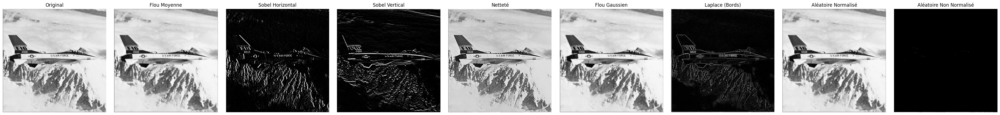

In [9]:
# Appliquer les filtres sur l’image en niveaux de gris
blurred_gray = apply_convolution(gray_image, blur_kernel)
sobel_h_gray = apply_convolution(gray_image, sobel_horizontal)
sobel_v_gray = apply_convolution(gray_image, sobel_vertical)
sharpened_gray = apply_convolution(gray_image, sharpen_kernel)
gaussian_gray = apply_convolution(gray_image, gaussian_kernel)
laplace_gray = apply_convolution(gray_image, laplace_kernel)
random_norm_gray = apply_convolution(gray_image, random_kernel_normalized)
random_gray = apply_convolution(gray_image, random_kernel)

# Liste des images filtrées et leurs titres
filtered_images = [
    blurred_gray,
    sobel_h_gray,
    sobel_v_gray,
    sharpened_gray,
    gaussian_gray,
    laplace_gray,
    random_norm_gray,
    random_gray
]
titles = [name for _, name in filters]

# Afficher les résultats
display_images(gray_image, filtered_images, titles)

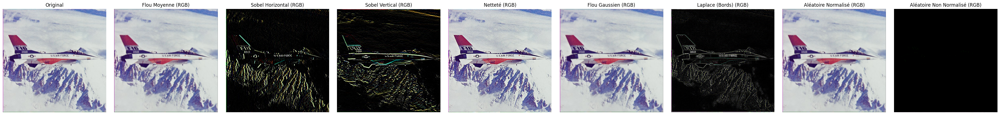

In [13]:
# Appliquer les filtres sur l’image RGB
filtered_rgb_images = []
rgb_titles = []
for kernel, name in filters:
    filtered_image = apply_convolution(rgb_image, kernel)
    filtered_rgb_images.append(filtered_image)
    rgb_titles.append(name + " (RGB)")
    # Sauvegarder
    save_name = name.lower().replace(" ", "_").replace("é", "e") + "_rgb.jpg"
    cv2.imwrite(save_name, cv2.cvtColor(filtered_image, cv2.COLOR_RGB2BGR))



# Afficher les résultats pour l’image RGB
display_images(rgb_image, filtered_rgb_images, rgb_titles)

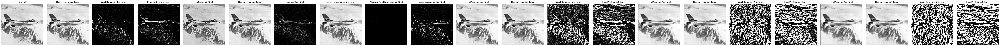

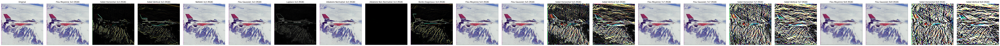

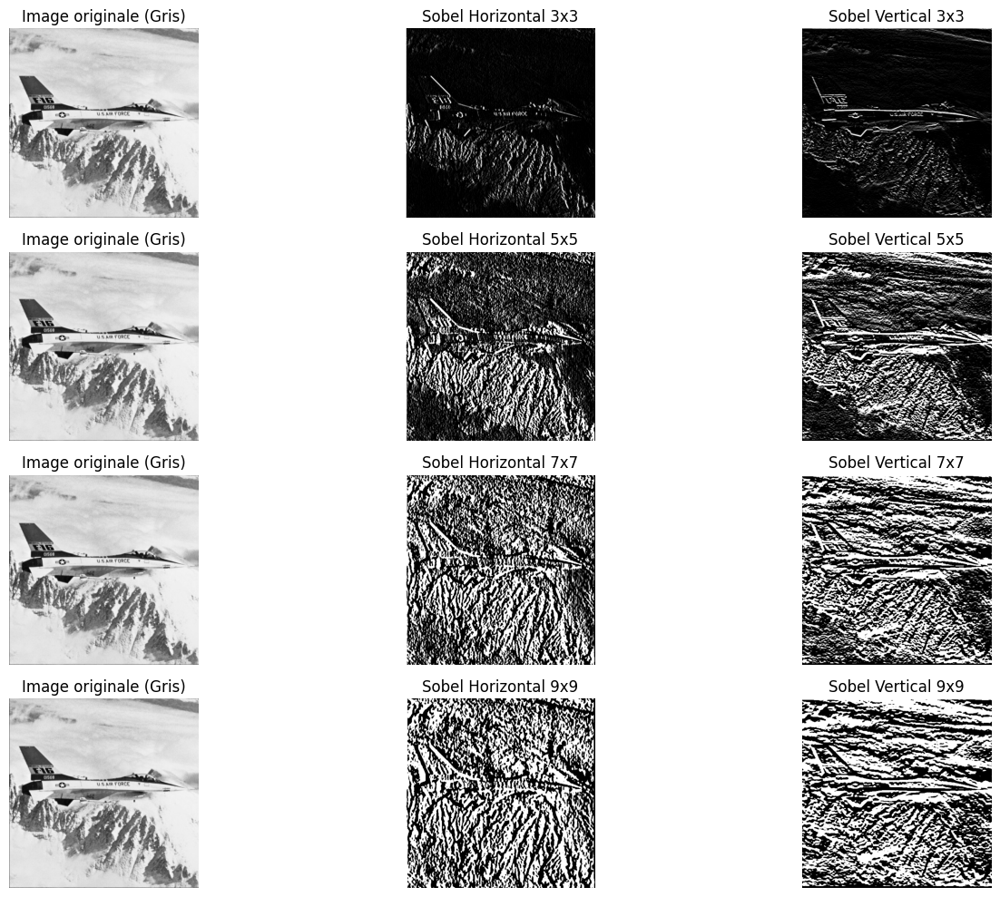

In [19]:
 # Définir les filtres
np.random.seed(42)

# Filtres 3x3
blur_kernel_3x3 = np.array([[1/9, 1/9, 1/9], [1/9, 1/9, 1/9], [1/9, 1/9, 1/9]])
sobel_horizontal_3x3 = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_vertical_3x3 = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
sharpen_kernel_3x3 = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
gaussian_kernel_3x3 = np.array([[1/16, 2/16, 1/16], [2/16, 4/16, 2/16], [1/16, 2/16, 1/16]])
laplace_kernel_3x3 = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
random_kernel_normalized_3x3 = np.random.rand(3, 3)
random_kernel_normalized_3x3 /= random_kernel_normalized_3x3.sum()
random_kernel_3x3 = np.random.rand(3, 3) * 2 - 1

# Nouveau filtre : Détection de bords diagonaux (45°)
edge_diagonal_kernel_3x3 = np.array([[2, 1, 0], [1, 0, -1], [0, -1, -2]])

# Filtres 5x5
blur_kernel_5x5 = np.ones((5, 5)) / 25
gaussian_kernel_5x5 = np.array([
    [1, 4, 6, 4, 1],
    [4, 16, 24, 16, 4],
    [6, 24, 36, 24, 6],
    [4, 16, 24, 16, 4],
    [1, 4, 6, 4, 1]
]) / 256
sobel_horizontal_5x5 = np.array([
    [-1, -2, 0, 2, 1],
    [-4, -8, 0, 8, 4],
    [-6, -12, 0, 12, 6],
    [-4, -8, 0, 8, 4],
    [-1, -2, 0, 2, 1]
])
sobel_vertical_5x5 = np.array([
    [-1, -4, -6, -4, -1],
    [-2, -8, -12, -8, -2],
    [0, 0, 0, 0, 0],
    [2, 8, 12, 8, 2],
    [1, 4, 6, 4, 1]
])

# Filtres 7x7
blur_kernel_7x7 = np.ones((7, 7)) / 49
gaussian_kernel_7x7 = np.array([
    [1, 4, 8, 10, 8, 4, 1],
    [4, 16, 32, 40, 32, 16, 4],
    [8, 32, 64, 80, 64, 32, 8],
    [10, 40, 80, 100, 80, 40, 10],
    [8, 32, 64, 80, 64, 32, 8],
    [4, 16, 32, 40, 32, 16, 4],
    [1, 4, 8, 10, 8, 4, 1]
], dtype=np.float32)

# Normalisation correcte (calcule la somme exacte)
gaussian_kernel_7x7 /= gaussian_kernel_7x7.sum()
sobel_horizontal_7x7 = np.array([
    [-1, -2, -3, 0, 3, 2, 1],
    [-4, -8, -12, 0, 12, 8, 4],
    [-7, -14, -21, 0, 21, 14, 7],
    [-10, -20, -30, 0, 30, 20, 10],
    [-7, -14, -21, 0, 21, 14, 7],
    [-4, -8, -12, 0, 12, 8, 4],
    [-1, -2, -3, 0, 3, 2, 1]
])
sobel_vertical_7x7 = np.array([
    [-1, -4, -7, -10, -7, -4, -1],
    [-2, -8, -14, -20, -14, -8, -2],
    [-3, -12, -21, -30, -21, -12, -3],
    [0, 0, 0, 0, 0, 0, 0],
    [3, 12, 21, 30, 21, 12, 3],
    [2, 8, 14, 20, 14, 8, 2],
    [1, 4, 7, 10, 7, 4, 1]
])

# Filtres 9x9
blur_kernel_9x9 = np.ones((9, 9)) / 81
gaussian_kernel_9x9 = np.array([
    [1, 4, 8, 10, 12, 10, 8, 4, 1],
    [4, 16, 32, 40, 48, 40, 32, 16, 4],
    [8, 32, 64, 80, 96, 80, 64, 32, 8],
    [10, 40, 80, 100, 120, 100, 80, 40, 10],
    [12, 48, 96, 120, 144, 120, 96, 48, 12],
    [10, 40, 80, 100, 120, 100, 80, 40, 10],
    [8, 32, 64, 80, 96, 80, 64, 32, 8],
    [4, 16, 32, 40, 48, 40, 32, 16, 4],
    [1, 4, 8, 10, 12, 10, 8, 4, 1]
], dtype=np.float32)

# Correction automatique : normalisation par la vraie somme
gaussian_kernel_9x9 /= gaussian_kernel_9x9.sum()
sobel_horizontal_9x9 = np.array([
    [-1, -2, -3, -4, 0, 4, 3, 2, 1],
    [-5, -10, -15, -20, 0, 20, 15, 10, 5],
    [-9, -18, -27, -36, 0, 36, 27, 18, 9],
    [-14, -28, -42, -56, 0, 56, 42, 28, 14],
    [-15, -30, -45, -60, 0, 60, 45, 30, 15],
    [-14, -28, -42, -56, 0, 56, 42, 28, 14],
    [-9, -18, -27, -36, 0, 36, 27, 18, 9],
    [-5, -10, -15, -20, 0, 20, 15, 10, 5],
    [-1, -2, -3, -4, 0, 4, 3, 2, 1]
])
sobel_vertical_9x9 = np.array([
    [-1, -5, -9, -14, -15, -14, -9, -5, -1],
    [-2, -10, -18, -28, -30, -28, -18, -10, -2],
    [-3, -15, -27, -42, -45, -42, -27, -15, -3],
    [-4, -20, -36, -56, -60, -56, -36, -20, -4],
    [0, 0, 0, 0, 0, 0, 0, 0, 0],
    [4, 20, 36, 56, 60, 56, 36, 20, 4],
    [3, 15, 27, 42, 45, 42, 27, 15, 3],
    [2, 10, 18, 28, 30, 28, 18, 10, 2],
    [1, 5, 9, 14, 15, 14, 9, 5, 1]
])

# Liste des filtres
filters = [
    (blur_kernel_3x3, "Flou Moyenne 3x3"),
    (sobel_horizontal_3x3, "Sobel Horizontal 3x3"),
    (sobel_vertical_3x3, "Sobel Vertical 3x3"),
    (sharpen_kernel_3x3, "Netteté 3x3"),
    (gaussian_kernel_3x3, "Flou Gaussien 3x3"),
    (laplace_kernel_3x3, "Laplace 3x3"),
    (random_kernel_normalized_3x3, "Aléatoire Normalisé 3x3"),
    (random_kernel_3x3, "Aléatoire Non Normalisé 3x3"),
    (edge_diagonal_kernel_3x3, "Bords Diagonaux 3x3"),
    (blur_kernel_5x5, "Flou Moyenne 5x5"),
    (gaussian_kernel_5x5, "Flou Gaussien 5x5"),
    (sobel_horizontal_5x5, "Sobel Horizontal 5x5"),
    (sobel_vertical_5x5, "Sobel Vertical 5x5"),
    (blur_kernel_7x7, "Flou Moyenne 7x7"),
    (gaussian_kernel_7x7, "Flou Gaussien 7x7"),
    (sobel_horizontal_7x7, "Sobel Horizontal 7x7"),
    (sobel_vertical_7x7, "Sobel Vertical 7x7"),
    (blur_kernel_9x9, "Flou Moyenne 9x9"),
    (gaussian_kernel_9x9, "Flou Gaussien 9x9"),
    (sobel_horizontal_9x9, "Sobel Horizontal 9x9"),
    (sobel_vertical_9x9, "Sobel Vertical 9x9")
]

# Valider les filtres
for kernel, name in filters:
    assert isinstance(kernel, np.ndarray), f"Filtre '{name}': tableau NumPy"
    assert len(kernel.shape) == 2, f"Filtre '{name}': matrice 2D"
    assert kernel.shape[0] == kernel.shape[1], f"Filtre '{name}': carré"
    assert kernel.shape[0] % 2 == 1, f"Filtre '{name}': taille impaire"
    if "Flou" in name or "Aléatoire Normalisé" in name:
        assert abs(kernel.sum() - 1.0) < 1e-6, f"Filtre '{name}': non normalisé"


# Appliquer les filtres sur l’image en niveaux de gris
filtered_gray_images = []
gray_titles = []
for kernel, name in filters:
    filtered_image = apply_convolution(gray_image, kernel)
    filtered_gray_images.append(filtered_image)
    gray_titles.append(name + " (Gris)")
    # Sauvegarder
    save_name = name.lower().replace(" ", "_").replace("é", "e") + "_gray.jpg"
    cv2.imwrite(save_name, filtered_image)

# Appliquer les filtres sur l’image RGB
filtered_rgb_images = []
rgb_titles = []
for kernel, name in filters:
    filtered_image = apply_convolution(rgb_image, kernel)
    filtered_rgb_images.append(filtered_image)
    rgb_titles.append(name + " (RGB)")
    # Sauvegarder
    save_name = name.lower().replace(" ", "_").replace("é", "e") + "_rgb.jpg"
    cv2.imwrite(save_name, cv2.cvtColor(filtered_image, cv2.COLOR_RGB2BGR))

# Afficher les résultats pour l’image en niveaux de gris
display_images(gray_image, filtered_gray_images, gray_titles)

# Afficher les résultats pour l’image RGB
display_images(rgb_image, filtered_rgb_images, rgb_titles)

# Comparaison Sobel horizontal vs vertical (toutes tailles)
plt.figure(figsize=(15, 10))
sobel_pairs = [
    (sobel_horizontal_3x3, sobel_vertical_3x3, "3x3"),
    (sobel_horizontal_5x5, sobel_vertical_5x5, "5x5"),
    (sobel_horizontal_7x7, sobel_vertical_7x7, "7x7"),
    (sobel_horizontal_9x9, sobel_vertical_9x9, "9x9")
]
for i, (h_kernel, v_kernel, size) in enumerate(sobel_pairs, 1):
    h_image = apply_convolution(gray_image, h_kernel)
    v_image = apply_convolution(gray_image, v_kernel)
    plt.subplot(4, 3, 3 * (i - 1) + 1)
    plt.title(f"Image originale (Gris)")
    plt.imshow(gray_image, cmap='gray')
    plt.axis('off')
    plt.subplot(4, 3, 3 * (i - 1) + 2)
    plt.title(f"Sobel Horizontal {size}")
    plt.imshow(h_image, cmap='gray')
    plt.axis('off')
    plt.subplot(4, 3, 3 * (i - 1) + 3)
    plt.title(f"Sobel Vertical {size}")
    plt.imshow(v_image, cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()